In [1]:
import datetime as dt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, plot_confusion_matrix

## Part 1 - Exploratory data analysis

In [2]:
df_login = pd.read_json('logins.json', convert_dates=True)
df_login.head()

,login_time
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10
2,1970-01-01 20:16:37
3,1970-01-01 20:16:36
4,1970-01-01 20:26:21


In [3]:
# check dtype
df_login.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93142 entries, 0 to 93141
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   login_time  93142 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 727.8 KB


In [4]:
# it can be performed with time series analysis
df_login.set_index('login_time', inplace=True)
df_login.sort_index(inplace=True)
df_login.head(10)

""
login_time
1970-01-01 20:12:16
1970-01-01 20:13:18
1970-01-01 20:16:10
1970-01-01 20:16:36
1970-01-01 20:16:37
1970-01-01 20:21:41
1970-01-01 20:26:05
1970-01-01 20:26:21
1970-01-01 20:31:03


In [5]:
# verify count col and check dtype
df_login['count'] = 1
df_login.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 93142 entries, 1970-01-01 20:12:16 to 1970-04-13 18:57:38
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   count   93142 non-null  int64
dtypes: int64(1)
memory usage: 1.4 MB


In [6]:
# resample data into 15 min frame
df_login = df_login.resample('15min').sum()
df_login.head()

,count
login_time,
1970-01-01 20:00:00,2
1970-01-01 20:15:00,6
1970-01-01 20:30:00,9
1970-01-01 20:45:00,7
1970-01-01 21:00:00,1


In [7]:
# input new columns for analysis
df_login['month'] = [m for m in df_login.index.month]
df_login['day'] = [d for d in df_login.index.day]
df_login['weekday'] = [d for d in df_login.index.dayofweek]
df_login['weekday_name'] = [d for d in df_login.index.day_name()]
df_login['date'] = [d for d in df_login.index.date]
df_login['time'] = [d.time() for d in df_login.index]
df_login.sample(5)

,count,month,day,weekday,weekday_name,date,time
login_time,,,,,,,
1970-02-16 07:00:00,1,2,16,0,Monday,1970-02-16,07:00:00
1970-01-29 15:15:00,10,1,29,3,Thursday,1970-01-29,15:15:00
1970-03-26 23:15:00,18,3,26,3,Thursday,1970-03-26,23:15:00
1970-03-05 00:30:00,17,3,5,3,Thursday,1970-03-05,00:30:00
1970-01-17 09:30:00,1,1,17,5,Saturday,1970-01-17,09:30:00


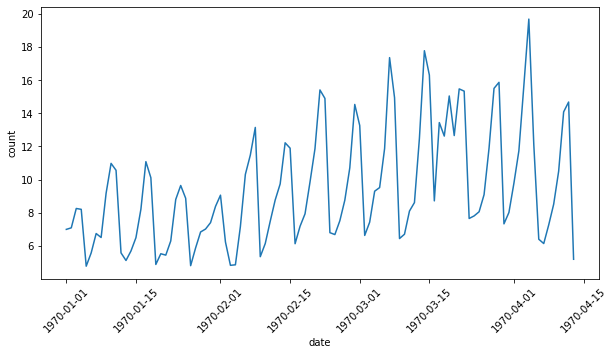

In [8]:
plt.figure(figsize=(10,5))
sns.lineplot(x='date', y='count', data=df_login, ci=None)
plt.xticks(rotation=45);

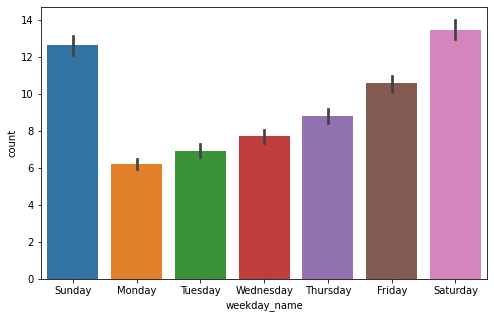

In [9]:
plt.figure(figsize=(8,5))
cat_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
sns.barplot(x='weekday_name', y='count', data=df_login, order=cat_order);

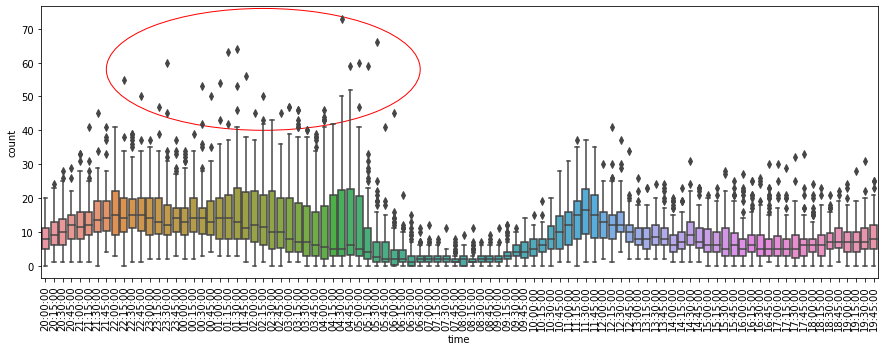

In [10]:
plt.figure(figsize=(15,5))
sns.boxplot(x='time', y='count', data=df_login)
plt.xticks(rotation=90)
circle1 = plt.Circle((25, 58), 18, color='r', fill=False)
plt.gca().add_patch(circle1);

The time between 05:30 and 10:30 has the least trips. The quiet morning hours may be due to people commuting to work to avoid heavy traffic. But the surprising fact is the wide variation between 23:00 and 05:30. Let's further explore that area.

<Figure size 1080x360 with 0 Axes>

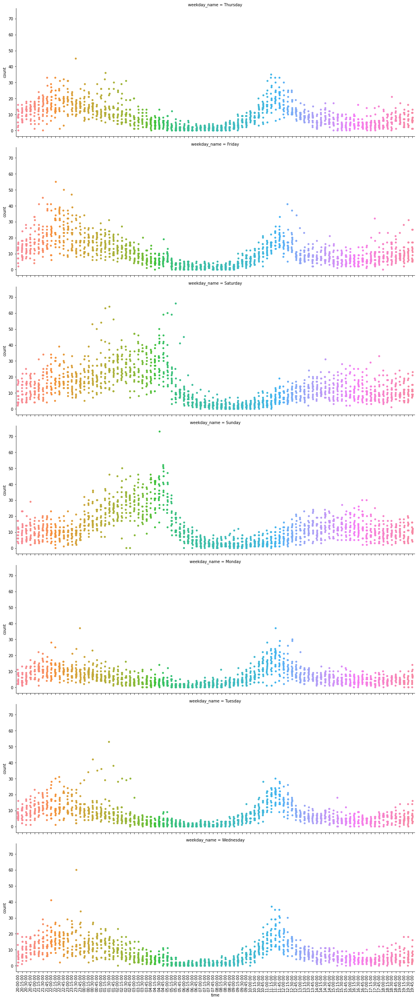

In [11]:
plt.figure(figsize=(15,5))
sns.catplot(x='time', y='count', row='weekday_name', data=df_login, height=5, aspect=15/5)
plt.xticks(rotation=90);

The plots above tell us 3 important observations:

1. Wide range between 23:00 and 05:30 is mainly on weekend trips. It could be due to people requesting a ride home after partying or some other reasons. 

2. Peak hours show between 10:30 to 13:00 on weekdays. It may be due to workers meeting their clients during this time.

3. Friday between 21:30 and 22:30 has a higher variance than any other days, most likely due to people working late or going for drinks on Fridays.

I believe our revenue will increase by capturing the high demand in these hours.

## Part 2 - Experiment and metrics design

Problem: driver partners tend to be exlusive to each city due to toll bridge costs

Solution: Toll costs reimbursed to drivers to encourage them servicing in both cities

Null hypothesis: amount or percentage of drivers does not change much, i.e., drivers remain only servicing in one of the cities after the proposed change

Alternative hypothesis: high amount or percentage of drivers now service in both cities after the proposed change

The amount or percentage of drivers is an important metric because this is what we want to find out if our reimbursement plan is an effective incentive or not.

Practical experiment:

a. Experiment:
- Include locations of pick-up and drop-off cities
- Group by drivers (supposed this column exists in another file), pick-up city, and drop-off city
- Count the unique values to see if the driver works in 1 city or 2 cities.

b. Statistical tests:

This is a problem of using categorical input to predict quantitative output from the same population as a pre and post setting. Hence, we will use the paired t-test for statistical testing.

c. Interpretations:
- If p-value < the critical value at 95% confidence interval, reject null hypothesis and conclude that our reimbursement plan is effective.
- If p-value > the critical value at 95% confidence interval, it means that our reimbursement interval may not work well, and we may promote other incentives to encourage driver partners servicing in both cities.
- One of the caveats is the amount of time we let the plan run before using the results in the statistical test, as drivers may take time to adapt to change.

## Part 3 - Predictive modeling

In [12]:
df_users = pd.read_json('ultimate_data_challenge.json')
df_users.head()

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver
0,King's Landing,4,2014-01-25,4.7,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0
2,Astapor,3,2014-01-06,4.3,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0
3,King's Landing,9,2014-01-10,4.6,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9
4,Winterfell,14,2014-01-27,4.4,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9


### Data wrangling and EDA

In [13]:
# check dtype and number of missing values
df_users.rename(columns={'city':'signup_city', 'avg_dist':'avg_dist_30d', 'trips_in_first_30_days':'trips_30d', 'ultimate_black_user':'ultimate_black_30d', 'surge_pct':'trip_surge_pct'}, inplace=True)
df_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   signup_city           50000 non-null  object 
 1   trips_30d             50000 non-null  int64  
 2   signup_date           50000 non-null  object 
 3   avg_rating_of_driver  41878 non-null  float64
 4   avg_surge             50000 non-null  float64
 5   last_trip_date        50000 non-null  object 
 6   phone                 49604 non-null  object 
 7   trip_surge_pct        50000 non-null  float64
 8   ultimate_black_30d    50000 non-null  bool   
 9   weekday_pct           50000 non-null  float64
 10  avg_dist_30d          50000 non-null  float64
 11  avg_rating_by_driver  49799 non-null  float64
dtypes: bool(1), float64(6), int64(1), object(4)
memory usage: 4.2+ MB


In [14]:
# verify new datetime dtype
df_users['signup_date'] = pd.to_datetime(df_users['signup_date'], format='%Y-%m-%d')
df_users['last_trip_date'] = pd.to_datetime(df_users['last_trip_date'], format='%Y-%m-%d')
df_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   signup_city           50000 non-null  object        
 1   trips_30d             50000 non-null  int64         
 2   signup_date           50000 non-null  datetime64[ns]
 3   avg_rating_of_driver  41878 non-null  float64       
 4   avg_surge             50000 non-null  float64       
 5   last_trip_date        50000 non-null  datetime64[ns]
 6   phone                 49604 non-null  object        
 7   trip_surge_pct        50000 non-null  float64       
 8   ultimate_black_30d    50000 non-null  bool          
 9   weekday_pct           50000 non-null  float64       
 10  avg_dist_30d          50000 non-null  float64       
 11  avg_rating_by_driver  49799 non-null  float64       
dtypes: bool(1), datetime64[ns](2), float64(6), int64(1), object(2)
memory usag

In [15]:
# compute missing values
missing = pd.concat([df_users.isnull().sum(), df_users.isnull().mean()*100], axis=1)
missing.columns = ['count', '%']
missing.sort_values(by='%', ascending=False)

,count,%
avg_rating_of_driver,8122,16.244
phone,396,0.792
avg_rating_by_driver,201,0.402
signup_city,0,0.000
trips_30d,0,0.000
signup_date,0,0.000
avg_surge,0,0.000
last_trip_date,0,0.000
trip_surge_pct,0,0.000
ultimate_black_30d,0,0.000


There is no rationale to guess the type of phone and avg rating by driver, and they only occupies around 1% of our dataset, we can drop the rows containing these missing values.

In [16]:
df_users.dropna(subset=['phone', 'avg_rating_by_driver'], inplace=True)

In [17]:
# check outliers and understand data
df_users.describe()

,trips_30d,avg_rating_of_driver,avg_surge,trip_surge_pct,weekday_pct,avg_dist_30d,avg_rating_by_driver
count,49406.000000,41445.000000,49406.000000,49406.000000,49406.000000,49406.000000,49406.000000
mean,2.284176,4.601720,1.074617,8.846788,60.913282,5.783987,4.777861
std,3.799164,0.616104,0.221009,19.890166,37.023166,5.627329,0.447114
min,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,4.300000,1.000000,0.000000,33.300000,2.420000,4.700000
50%,1.000000,4.900000,1.000000,0.000000,66.700000,3.880000,5.000000
75%,3.000000,5.000000,1.050000,8.700000,100.000000,6.930000,5.000000
max,125.000000,5.000000,8.000000,100.000000,100.000000,79.690000,5.000000


In [18]:
# check first and last trip dates
print('first trip date:', df_users['last_trip_date'].sort_values()[:1])
print('last trip date:', df_users['last_trip_date'].sort_values()[-1:])

first trip date: 39490   2014-01-01
Name: last_trip_date, dtype: datetime64[ns]
last trip date: 13504   2014-07-01
Name: last_trip_date, dtype: datetime64[ns]


In [19]:
cutoff_days = 30
cutoff_date = sorted(df_users['last_trip_date'])[-1] - dt.timedelta(cutoff_days)
cutoff_date.strftime('%Y-%m-%d')
cutoff_date

Timestamp('2014-06-01 00:00:00')

In [20]:
# add new columns: rated_driver, active
df_users.sort_values(by='signup_date', ascending=True, inplace=True)
df_users['rated_driver'] = np.where(df_users['avg_rating_of_driver'].notnull(), 1, 0)
df_users['active'] = np.where((df_users['last_trip_date'] - cutoff_date).dt.days > 0, 1, 0)
df_users.head()

,signup_city,trips_30d,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,trip_surge_pct,ultimate_black_30d,weekday_pct,avg_dist_30d,avg_rating_by_driver,rated_driver,active
39073,Astapor,3,2014-01-01,5.0,1.0,2014-04-20,Android,0.0,False,50.0,2.23,4.8,1,0
32172,Astapor,1,2014-01-01,NaN,1.0,2014-01-02,iPhone,0.0,True,100.0,3.56,5.0,0,0
20395,Astapor,0,2014-01-01,5.0,1.0,2014-06-01,Android,0.0,True,0.0,5.76,5.0,1,0
32169,Astapor,1,2014-01-01,5.0,1.0,2014-06-27,iPhone,0.0,True,100.0,3.46,5.0,1,1
10264,Winterfell,1,2014-01-01,4.0,1.0,2014-01-02,iPhone,0.0,False,100.0,0.69,5.0,1,0


In [21]:
df_users['ultimate_black_30d'] = df_users['ultimate_black_30d'].astype(int)
df_users.head()

,signup_city,trips_30d,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,trip_surge_pct,ultimate_black_30d,weekday_pct,avg_dist_30d,avg_rating_by_driver,rated_driver,active
39073,Astapor,3,2014-01-01,5.0,1.0,2014-04-20,Android,0.0,0,50.0,2.23,4.8,1,0
32172,Astapor,1,2014-01-01,NaN,1.0,2014-01-02,iPhone,0.0,1,100.0,3.56,5.0,0,0
20395,Astapor,0,2014-01-01,5.0,1.0,2014-06-01,Android,0.0,1,0.0,5.76,5.0,1,0
32169,Astapor,1,2014-01-01,5.0,1.0,2014-06-27,iPhone,0.0,1,100.0,3.46,5.0,1,1
10264,Winterfell,1,2014-01-01,4.0,1.0,2014-01-02,iPhone,0.0,0,100.0,0.69,5.0,1,0


In [22]:
print('Around', round(df_users['active'].mean()*100, 2),'% of the observed users were retained.')

Around 36.73 % of the observed users were retained.


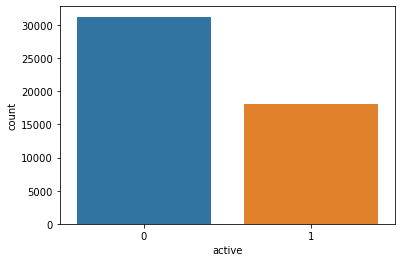

In [23]:
sns.countplot(x='active', data=df_users);

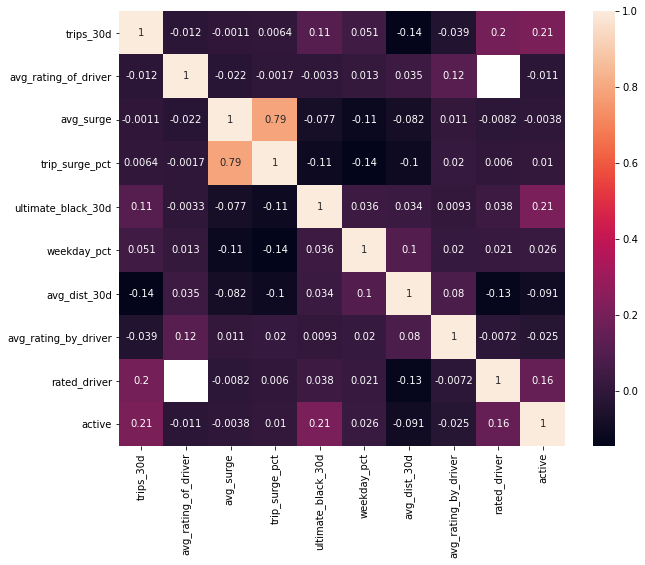

In [24]:
plt.figure(figsize=(10,8))
sns.heatmap(df_users.corr(), annot=True);

Based on the heatmap above, it seems that number of trips the user took in the first 30 days after signing up (trips_30d), whether the user took an Ultimate Black in their first 30 days (ultimate_black_30d), and if they rated the driver (rated_driver) have a higher correlation with whether the user is active or not.

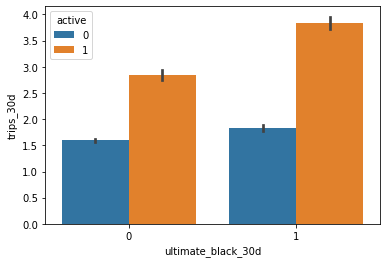

In [25]:
sns.barplot(x='ultimate_black_30d', y='trips_30d', hue='active', data=df_users);

For the first 30 days, we see that the users who took an Ultimate Black have a higher chance of being an active user. Likewise, users took around 3 trips or more have a higher chance of being an active user than those who took less than 2 trips.

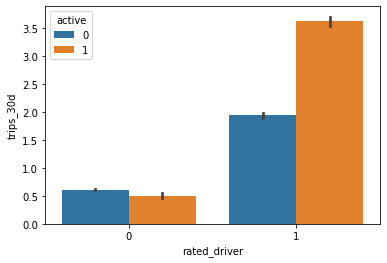

In [26]:
sns.barplot(x='rated_driver', y='trips_30d', hue='active', data=df_users);

Users who rated their drivers tend to ride more trips within the first 30 days. That can be explained by user engagement. The more engaged the user, the higher the chance the uesr will be a loyal consumer.

### Preprocessing and modeling

In [27]:
df = df_users.drop(columns=['signup_date', 'last_trip_date', 'avg_rating_of_driver'], axis=1)
df.head()

,signup_city,trips_30d,avg_surge,phone,trip_surge_pct,ultimate_black_30d,weekday_pct,avg_dist_30d,avg_rating_by_driver,rated_driver,active
39073,Astapor,3,1.0,Android,0.0,0,50.0,2.23,4.8,1,0
32172,Astapor,1,1.0,iPhone,0.0,1,100.0,3.56,5.0,0,0
20395,Astapor,0,1.0,Android,0.0,1,0.0,5.76,5.0,1,0
32169,Astapor,1,1.0,iPhone,0.0,1,100.0,3.46,5.0,1,1
10264,Winterfell,1,1.0,iPhone,0.0,0,100.0,0.69,5.0,1,0


In [28]:
# check missing values again
missing = pd.concat([df.isnull().sum(), df.isnull().mean()*100], axis=1)
missing.columns = ['count', '%']
missing.sort_values(by='%', ascending=False)

,count,%
signup_city,0,0.0
trips_30d,0,0.0
avg_surge,0,0.0
phone,0,0.0
trip_surge_pct,0,0.0
ultimate_black_30d,0,0.0
weekday_pct,0,0.0
avg_dist_30d,0,0.0
avg_rating_by_driver,0,0.0
rated_driver,0,0.0


In [29]:
# check dtype
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49406 entries, 39073 to 39408
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   signup_city           49406 non-null  object 
 1   trips_30d             49406 non-null  int64  
 2   avg_surge             49406 non-null  float64
 3   phone                 49406 non-null  object 
 4   trip_surge_pct        49406 non-null  float64
 5   ultimate_black_30d    49406 non-null  int64  
 6   weekday_pct           49406 non-null  float64
 7   avg_dist_30d          49406 non-null  float64
 8   avg_rating_by_driver  49406 non-null  float64
 9   rated_driver          49406 non-null  int64  
 10  active                49406 non-null  int64  
dtypes: float64(5), int64(4), object(2)
memory usage: 5.8+ MB


### Train test split

In [30]:
y = df['active']
X = df.drop('active', axis=1)
X = pd.get_dummies(X, drop_first=True)

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [32]:
clf = RandomForestClassifier()
results = clf.fit(X_train, y_train)
y_pred = results.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.81      0.81      6186
           1       0.68      0.66      0.67      3696

    accuracy                           0.75      9882
   macro avg       0.74      0.73      0.74      9882
weighted avg       0.75      0.75      0.75      9882



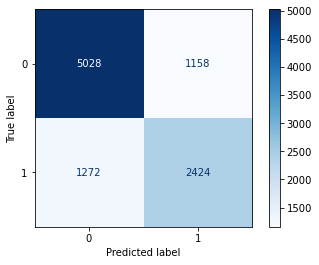

In [33]:
plot_confusion_matrix(clf, X_test, y_test, cmap=plt.cm.Blues)
plt.show()

We used random forest model to predict whether the user is an active user after 6 months of signup. The reason we used such model is because it is a great model by default hyperparameters, and it tends to avoid overfitting.

While 80% and 82% of precision score and recall score on negative values looks good, the 68% and 66% of precision score and recall score on positive values is the concern. The model seems to lack the ability to predict the positive variables.

Overall, the random forest mode has a 76% accuracy, which is not bad, compared to the base model of 63.27%, which is computed from the simple average of users categorized as an inactive users from above (1 - 36.73%).

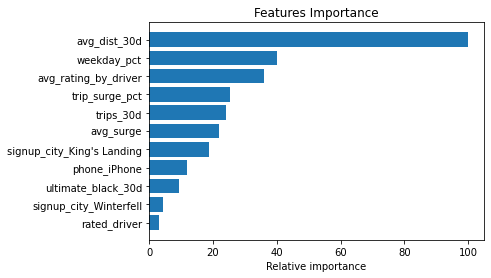

In [34]:
features = clf.feature_importances_
features = 100 * (features / features.max())
sorted_idx = np.argsort(features)

pos = np.arange(sorted_idx.shape[0]) + 0.5
plt.barh(pos, features[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative importance')
plt.title('Features Importance')
plt.show()

The features importance graph tells us the average distance per trip taken in the first 30 days is actually the most important feature to determine the active user (avg_dist_30d), followed by the percentage of trip occurring during weekdays (weekday_pct), and average rating by drivers (avg_rating_by_driver).

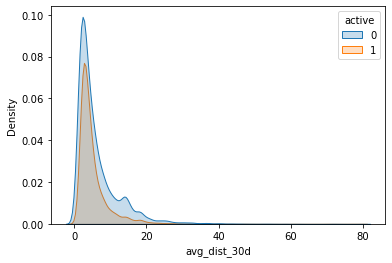

In [35]:
sns.kdeplot(x='avg_dist_30d', hue='active', data=df, fill=True);

Both active and inactive users ride a similar average distance in the first 30 days.

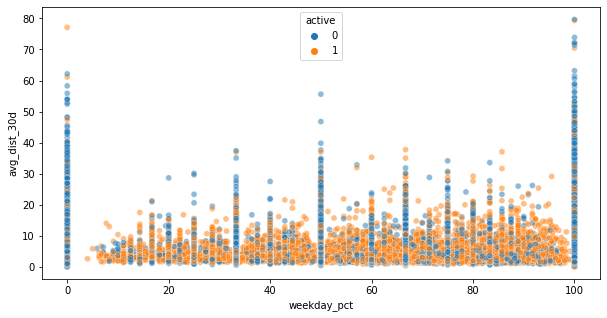

In [36]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='weekday_pct', y='avg_dist_30d', data=df, hue='active', alpha=0.5);

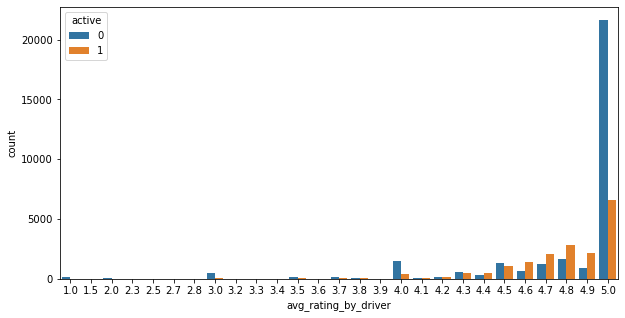

In [37]:
plt.figure(figsize=(10,5))
sns.countplot(x='avg_rating_by_driver', hue='active', data=df);

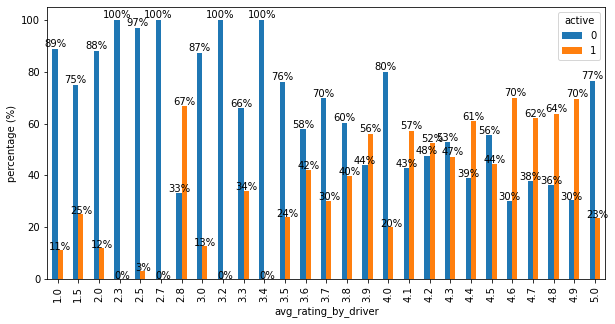

In [38]:
rating_active = pd.crosstab(df['avg_rating_by_driver'], df['active']).apply(lambda x: x/x.sum()*100, axis=1)
ax = rating_active.plot(kind='bar', figsize=(10,5))
plt.xlabel('avg_rating_by_driver')
plt.ylabel('percentage (%)')

for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax.annotate(f'{height/100:0.0%}', (x + width/2, y + height*1.01), ha='center')

The percentage graph tells us that there is a higher chance that the user won't be an active user if the rating by the driver is less than 4.0.

## Insights

In a nutshell, to improve the long-term rider retention, we should work on 2 approaches.

1. To incentivize more drivers servicing during weekdays, as this is where most active users tend to use our service.

2. To make the users engaged in taking the trip with us in the first 30 days, and possibly run a Ultimate Black promotion to enhance their experience.